In [2]:
# Importing libraries
from quantopian.research import run_pipeline
from quantopian.pipeline import Pipeline
from quantopian.pipeline.factors import Latest
from quantopian.pipeline.data.builtin import USEquityPricing
from quantopian.pipeline.data import morningstar
from quantopian.pipeline.factors import CustomFactor, SimpleMovingAverage, AverageDollarVolume, Returns, RSI
from quantopian.pipeline.classifiers.morningstar import Sector
from quantopian.pipeline.filters import Q500US, Q1500US
from quantopian.pipeline.data.quandl import fred_usdontd156n as libor
from quantopian.pipeline.data.zacks import EarningsSurprises

import talib
import pandas as pd
import numpy as np
from time import time

import alphalens as al
import pyfolio as pf
from scipy import stats
import matplotlib.pyplot as plt
from sklearn import linear_model, decomposition, ensemble, preprocessing, isotonic, metrics

In [3]:
# Factor definition

bs = morningstar.balance_sheet
cfs = morningstar.cash_flow_statement
is_ = morningstar.income_statement
or_ = morningstar.operation_ratios
er = morningstar.earnings_report
v = morningstar.valuation
vr = morningstar.valuation_ratios


def make_factors():
    class Vol_3M(CustomFactor):
        inputs = [Returns(window_length=2)]
        window_length = 63

        def compute(self, today, assets, out, rets):
            out[:] = np.nanstd(rets, axis=0)

    class Advanced_Momentum(CustomFactor):
        """ Momentum factor """
        inputs = [USEquityPricing.close,
                  Returns(window_length=126)]
        window_length = 252

        def compute(self, today, assets, out, prices, returns):
            out[:] = ((prices[-21] - prices[-252])/prices[-252] -
                      (prices[-1] - prices[-21])/prices[-21]) / np.nanstd(returns, axis=0) 
            
    class FCF_yield(CustomFactor):
        # Value factor
        # Free Cash Flow Yield
        # Free Cash Flow / Market Cap
        inputs=[cfs.free_cash_flow,
                v.market_cap]
        window_length=1

        def compute(self, today, assets, out, fcf, mkt_cap):
            out[:] = fcf[-1]/mkt_cap[-1]
    
    def Return_On_Total_Invest_Capital():
        return or_.roic.latest
    
    def Net_Income_Margin():
        return or_.net_margin.latest
    
    def EBIT_To_Assets():
        return (is_.ebit.latest * 4.) / \
            bs.total_assets.latest
            
    all_factors = {
        'Vol 3M': Vol_3M, # Vol 3M
        'Advanced_Momentum': Advanced_Momentum, # Momentum
        'FCF_Yield' : FCF_yield, # Value
        'EBIT_To_Assets' : EBIT_To_Assets, # Growth
        'Net_Income_Margin' : Net_Income_Margin, # Quality
        'Return_On_Total_Invest_Capital' : Return_On_Total_Invest_Capital # Value
    }
    
    
    
    return all_factors

In [4]:
# Univese definition
universe = Q1500US()
factors = make_factors()

In [5]:
n_fwd_days = 20 # number of days to compute returns over

In [6]:
def shift_mask_data(X, Y, upper_percentile=70, lower_percentile=30, n_fwd_days=1):
    # Shift X to match factors at t to returns at t+n_fwd_days (we want to predict future returns after all)
    shifted_X = np.roll(X, n_fwd_days, axis=0)
    
    # Slice off rolled elements
    X = shifted_X[n_fwd_days:]
    Y = Y[n_fwd_days:]
    
    n_time, n_stocks, n_factors = X.shape
    
    # Look for biggest up and down movers
    upper = np.nanpercentile(Y, upper_percentile, axis=1)[:, np.newaxis]
    lower = np.nanpercentile(Y, lower_percentile, axis=1)[:, np.newaxis]
  
    upper_mask = (Y >= upper)
    lower_mask = (Y <= lower)
    
    mask = upper_mask | lower_mask # This also drops nans
    mask = mask.flatten()
    
    # Only try to predict whether a stock moved up/down relative to other stocks
    Y_binary = np.zeros(n_time * n_stocks)
    Y_binary[upper_mask.flatten()] = 1
    Y_binary[lower_mask.flatten()] = -1
    
    # Flatten X
    X = X.reshape((n_time * n_stocks, n_factors))

    # Drop stocks that did not move much (i.e. are in the 30th to 70th percentile)
    X = X[mask]
    Y_binary = Y_binary[mask]
    
    return X, Y_binary

def get_last_values(input_data):
    last_values = []
    for dataset in input_data:
        last_values.append(dataset[-1])
    return np.vstack(last_values).T

In [7]:
class ML(CustomFactor):
    init = False

    def compute(self, today, assets, out, returns, *inputs):
        # inputs is a list of factors, for example, assume we have 2 alpha signals, 3 stocks,
        # and a lookback of 2 days. Each element in the inputs list will be data of
        # one signal, so len(inputs) == 2. Then each element will contain a 2-D array
        # of shape [time x stocks]. For example:
        # inputs[0]:
        # [[1, 3, 2], # factor 1 rankings of day t-1 for 3 stocks  
        #  [3, 2, 1]] # factor 1 rankings of day t for 3 stocks
        # inputs[1]:
        # [[2, 3, 1], # factor 2 rankings of day t-1 for 3 stocks
        #  [1, 2, 3]] # factor 2 rankings of day t for 3 stocks
        
        if (not self.init) or (today.weekday == 0): # Monday
            # Instantiate sklearn objects
            self.imputer = preprocessing.Imputer()
            self.scaler = preprocessing.MinMaxScaler()
            self.clf = ensemble.AdaBoostClassifier(n_estimators=100)
            
            # Stack factor rankings
            X = np.dstack(inputs) # (time, stocks, factors)
            Y = returns # (time, stocks)
        
            # Shift data to match with future returns and binarize 
            # returns based on their 
            X, Y = shift_mask_data(X, Y, n_fwd_days)
            
            X = self.imputer.fit_transform(X)            
            X = self.scaler.fit_transform(X)
            
            # Fit the classifier
            self.clf.fit(X, Y)
            
            self.init = True

        # Predict
        # Get most recent factor values (inputs always has the full history)
        last_factor_values = get_last_values(inputs)
        last_factor_values = self.imputer.transform(last_factor_values)
        last_factor_values = self.scaler.transform(last_factor_values)

        # Predict the probability for each stock going up 
        # (column 2 of the output of .predict_proba()) and
        # return it via assignment to out.
        out[:] = self.clf.predict_proba(last_factor_values)[:, 1]

In [8]:
from collections import OrderedDict

def make_ml_pipeline(factors, universe, window_length=30, n_fwd_days=5):
    factors_pipe = OrderedDict()
    # Create returns over last n days.
    factors_pipe['Returns'] = Returns(inputs=[USEquityPricing.open],
                                      mask=universe, window_length=n_fwd_days)
    # Instantiate ranked factors
    for name, f in factors.iteritems():
        factors_pipe[name] = f().rank(mask=universe)
        
    # Create our ML pipeline factor. The window_length will control how much
    # lookback the passed in data will have.
    factors_pipe['ML'] = ML(inputs=factors_pipe.values(), 
                            window_length=window_length + 1, 
                            mask=universe)
    
    pipe = Pipeline(screen=universe, columns=factors_pipe)
    
    return pipe

In [17]:
basic_factors = {name : factor() for name, factor in factors.iteritems()}
basic_factors['Equal-weighted'] = np.sum([factor.zscore() for factor in basic_factors.values()])

In [18]:
ml_pipe = make_ml_pipeline(factors, universe)
basic_pipe = Pipeline(
    columns=basic_factors,
    screen=universe
)

In [19]:
def run_pipeline_chunks(pipe, start_date, end_date, chunks_len = None):
    """
    Drop-in replacement for run_pipeline.
    run_pipeline fails over a very long period of time (memery usage),
    so we need to split in chunks the pipeline and concatenate the results
    """
    chunks  = []
    current = pd.Timestamp(start_date)
    end     = pd.Timestamp(end_date)
    step    = pd.Timedelta(weeks=26) if chunks_len is None else chunks_len
    
    while current <= end:
        
        current_end = current + step
        if current_end > end:
            current_end = end
        
        print 'Running pipeline:', current, ' - ', current_end
        results = run_pipeline(pipe, current.strftime("%Y-%m-%d"), current_end.strftime("%Y-%m-%d"))
        chunks.append(results)
        
        # pipeline returns more days than requested (if no trading day), so get last date from the results
        current_end = results.index.get_level_values(0)[-1].tz_localize(None)
        current = current_end + pd.Timedelta(days=1)

    return pd.concat(chunks)

## RUN PIPELINES

In [20]:
start_timer = time()
start = pd.Timestamp("2015-01-01") # Can't choose a much longer time-period or we run out of RAM
end = pd.Timestamp("2017-04-01")

results = run_pipeline_chunks(ml_pipe, start_date=start, end_date=end)
results = results.fillna(value=0);

end_timer = time()

Running pipeline: 2015-01-01 00:00:00  -  2015-07-02 00:00:00


/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1147: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


Running pipeline: 2015-07-03 00:00:00  -  2016-01-01 00:00:00
Running pipeline: 2016-01-05 00:00:00  -  2016-07-05 00:00:00
Running pipeline: 2016-07-06 00:00:00  -  2017-01-04 00:00:00
Running pipeline: 2017-01-05 00:00:00  -  2017-04-01 00:00:00


In [21]:
print "Time to run pipeline %.2f secs" % (end_timer - start_timer)

Time to run pipeline 353.21 secs


In [22]:
start_timer = time()
start = pd.Timestamp("2015-01-01") # Can't choose a much longer time-period or we run out of RAM
end = pd.Timestamp("2017-04-01")

basic_results = run_pipeline_chunks(basic_pipe, start_date=start, end_date=end)
basic_results = basic_results.fillna(value=0);

end_timer = time()

Running pipeline: 2015-01-01 00:00:00  -  2015-07-02 00:00:00
Running pipeline: 2015-07-03 00:00:00  -  2016-01-01 00:00:00
Running pipeline: 2016-01-05 00:00:00  -  2016-07-05 00:00:00
Running pipeline: 2016-07-06 00:00:00  -  2017-01-04 00:00:00
Running pipeline: 2017-01-05 00:00:00  -  2017-04-01 00:00:00


In [23]:
print "Time to run pipeline %.2f secs" % (end_timer - start_timer)

Time to run pipeline 247.32 secs


## PREPARE FOR ALPHALENS

In [99]:
basic_assets = basic_results.index.levels[1]
basic_pricing = get_pricing(basic_assets, start, end + pd.Timedelta(days=30), fields="open_price")

In [105]:
basic_momentum_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['Advanced_Momentum'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))
basic_fcf_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['FCF_Yield'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))
basic_vol_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['Vol 3M'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))
basic_ebit_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['EBIT_To_Assets'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))
basic_income_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['Net_Income_Margin'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))
basic_roi_factor = al.utils.get_clean_factor_and_forward_returns(basic_results['Return_On_Total_Invest_Capital'], basic_pricing, quantiles=3, periods = (1, 5, 10, 30))

In [121]:
fixed_aggregate = basic_results['Equal-weighted'] + np.random.normal(0, 0.00001, basic_results['Equal-weighted'].shape[0])

In [122]:
equal_weighted_factor = al.utils.get_clean_factor_and_forward_returns(fixed_aggregate, basic_pricing, quantiles=3, periods = (1, 5, 10, 30))

## GENERATE FACTOR TEAR SHEETS

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-18.676059,1.481722,-1.651366,1.461389,275517,33.446596
2,-3.014325,3.202974,0.468879,0.941035,273696,33.225534
3,-1.343405,18.827919,2.824339,1.670411,274539,33.327871


Returns Analysis


,1,5,10,30
Ann. alpha,0.024,0.026,0.024,0.010
beta,-0.115,-0.199,-0.230,-0.228
Mean Period Wise Return Top Quantile (bps),0.440,0.471,-0.708,-16.878
Mean Period Wise Return Bottom Quantile (bps),-0.642,-2.232,-4.049,1.094
Mean Period Wise Spread (bps),1.042,0.516,0.303,-0.605


Information Analysis


,1,5,10,30
IC Mean,0.012,0.015,0.010,-0.001
IC Std.,0.171,0.179,0.183,0.160
t-stat(IC),1.623,2.002,1.349,-0.179
p-value(IC),0.105,0.046,0.178,0.858
IC Skew,0.008,0.054,0.140,0.460
IC Kurtosis,-0.322,-0.428,-0.686,-0.377
Ann. IR,1.092,1.348,0.908,-0.120


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.065,0.152,0.219,0.345
Quantile 2 Mean Turnover,0.125,0.279,0.381,0.530
Quantile 3 Mean Turnover,0.062,0.143,0.207,0.333


,1,5,10,30
Mean Factor Rank Autocorrelation,0.985,0.928,0.862,0.697


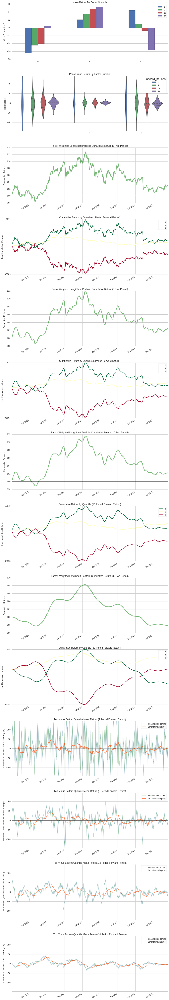

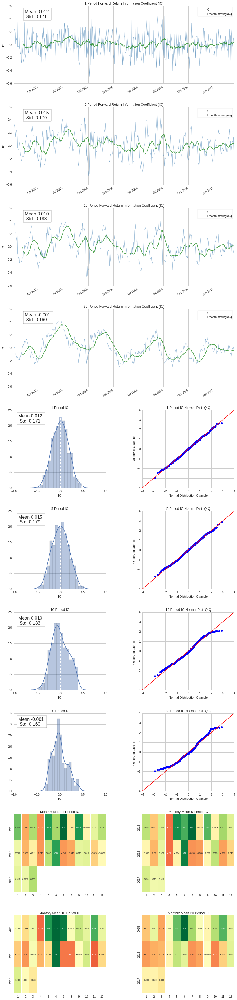

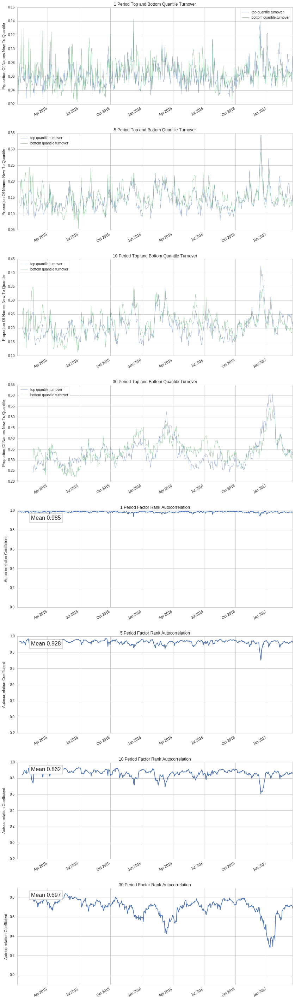

In [123]:
al.tears.create_full_tear_sheet(basic_momentum_factor)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.644641,0.005782,-0.028685,0.089443,279796,33.966048
2,-0.002947,0.023588,0.008934,0.004697,269385,32.702197
3,0.008803,4.719665,0.039383,0.049209,274571,33.331755


Returns Analysis


,1,5,10,30
Ann. alpha,0.012,0.010,0.005,0.022
beta,-0.095,-0.098,-0.079,-0.077
Mean Period Wise Return Top Quantile (bps),0.544,1.652,3.506,17.960
Mean Period Wise Return Bottom Quantile (bps),-1.310,-5.070,-10.251,-37.148
Mean Period Wise Spread (bps),1.894,1.395,1.430,1.886


Information Analysis


,1,5,10,30
IC Mean,0.006,0.011,0.015,0.029
IC Std.,0.069,0.070,0.067,0.066
t-stat(IC),2.034,3.619,5.179,10.263
p-value(IC),0.042,0.000,0.000,0.000
IC Skew,-0.259,-0.104,-0.005,-0.003
IC Kurtosis,-0.074,0.006,-0.255,-0.742
Ann. IR,1.369,2.436,3.486,6.909


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.012,0.051,0.097,0.259
Quantile 2 Mean Turnover,0.018,0.069,0.123,0.297
Quantile 3 Mean Turnover,0.016,0.063,0.115,0.294


,1,5,10,30
Mean Factor Rank Autocorrelation,0.987,0.937,0.875,0.636


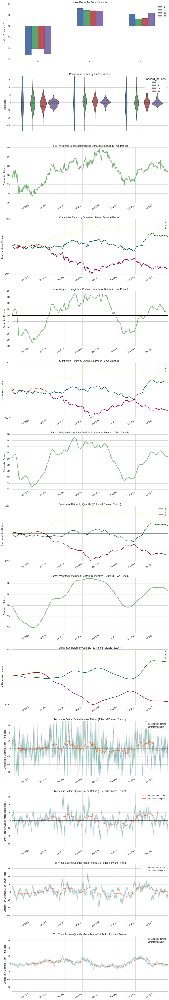

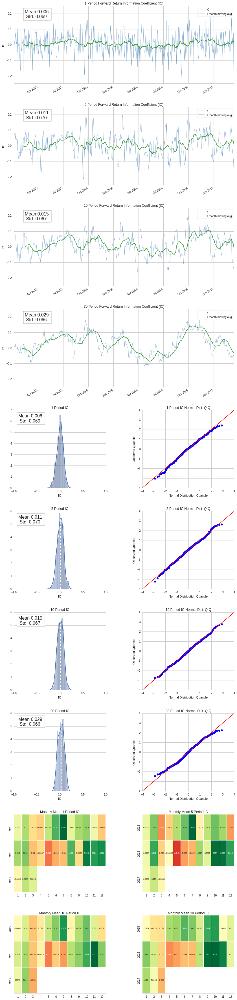

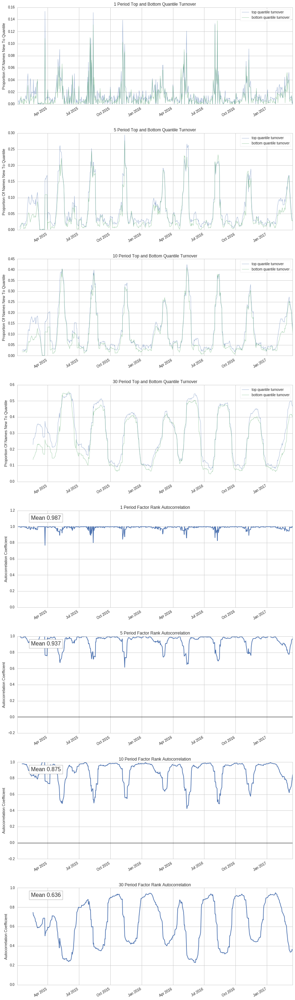

In [124]:
al.tears.create_full_tear_sheet(basic_fcf_factor)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.000857,0.019433,0.011943,0.002618,274777,33.356763
2,0.011130,0.028304,0.017611,0.003163,274404,33.311482
3,0.016383,1.022262,0.032578,0.020385,274571,33.331755


Returns Analysis


,1,5,10,30
Ann. alpha,-0.038,-0.033,-0.032,-0.039
beta,0.429,0.479,0.520,0.451
Mean Period Wise Return Top Quantile (bps),-0.954,-4.456,-7.005,-25.151
Mean Period Wise Return Bottom Quantile (bps),1.155,5.117,7.919,23.092
Mean Period Wise Spread (bps),-2.099,-1.931,-1.514,-1.627


Information Analysis


,1,5,10,30
IC Mean,-0.012,-0.021,-0.022,-0.035
IC Std.,0.213,0.214,0.216,0.190
t-stat(IC),-1.374,-2.336,-2.449,-4.353
p-value(IC),0.170,0.020,0.015,0.000
IC Skew,-0.161,0.001,0.034,-0.181
IC Kurtosis,-0.141,-0.335,-0.519,-0.404
Ann. IR,-0.925,-1.573,-1.649,-2.931


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.020,0.061,0.096,0.193
Quantile 2 Mean Turnover,0.034,0.102,0.161,0.314
Quantile 3 Mean Turnover,0.017,0.053,0.087,0.183


,1,5,10,30
Mean Factor Rank Autocorrelation,0.996,0.982,0.964,0.893


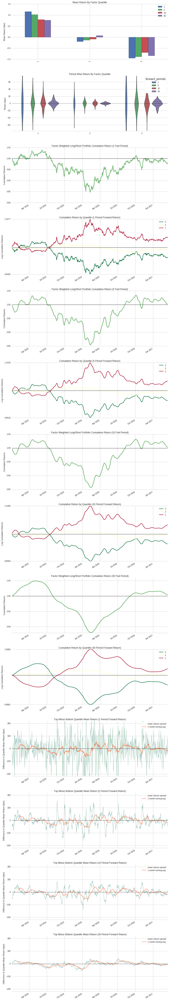

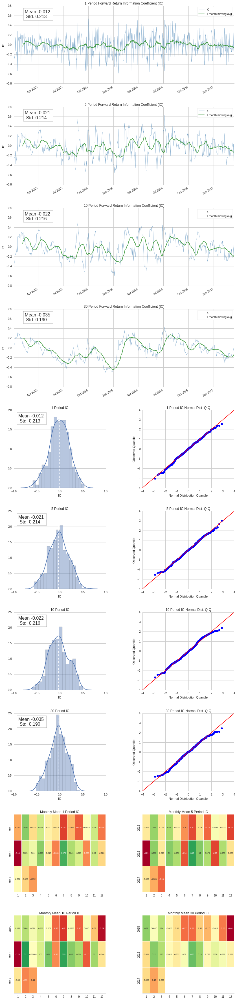

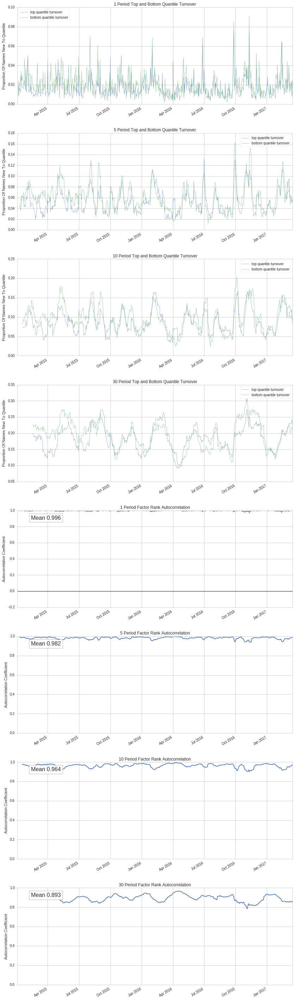

In [125]:
al.tears.create_full_tear_sheet(basic_vol_factor)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-40.065457,0.050562,-0.095419,0.587588,274777,33.356763
2,0.026078,0.113619,0.065811,0.019505,274404,33.311482
3,0.090863,259.328671,0.356272,5.770289,274571,33.331755


Returns Analysis


,1,5,10,30
Ann. alpha,-0.111,-0.124,-0.131,-0.126
beta,-0.173,-0.213,-0.216,-0.151
Mean Period Wise Return Top Quantile (bps),0.538,2.688,5.476,18.980
Mean Period Wise Return Bottom Quantile (bps),-0.148,-0.615,-0.925,-7.263
Mean Period Wise Spread (bps),0.689,0.692,0.680,0.915


Information Analysis


,1,5,10,30
IC Mean,0.007,0.012,0.012,0.017
IC Std.,0.102,0.104,0.106,0.117
t-stat(IC),1.587,2.727,2.576,3.449
p-value(IC),0.113,0.007,0.010,0.001
IC Skew,-0.041,-0.080,-0.109,0.105
IC Kurtosis,0.153,-0.062,-0.134,-0.674
Ann. IR,1.068,1.836,1.734,2.322


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.008,0.032,0.060,0.157
Quantile 2 Mean Turnover,0.010,0.042,0.079,0.202
Quantile 3 Mean Turnover,0.006,0.027,0.051,0.134


,1,5,10,30
Mean Factor Rank Autocorrelation,0.996,0.978,0.957,0.874


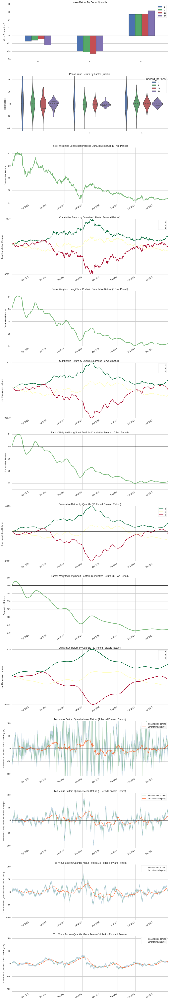

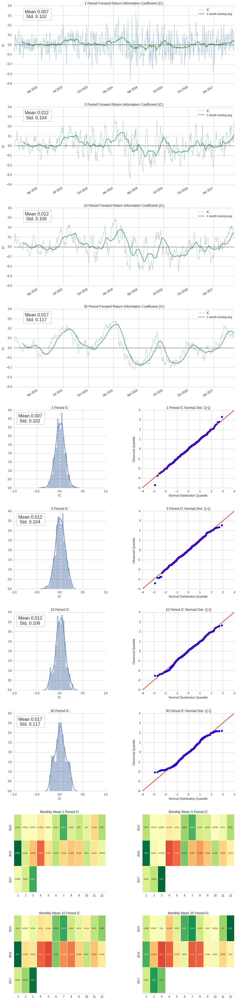

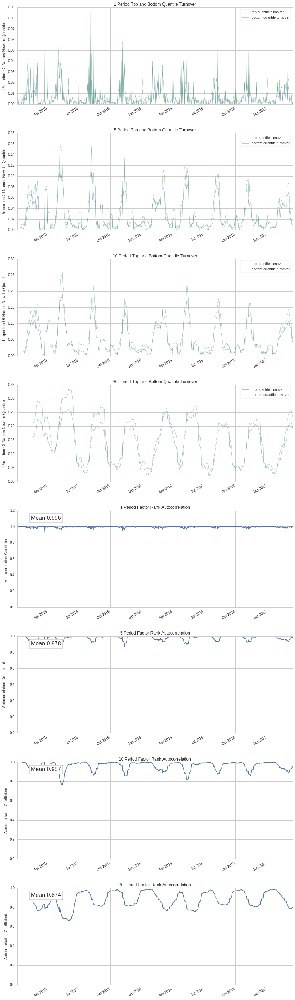

In [126]:
al.tears.create_full_tear_sheet(basic_ebit_factor)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-70174.943952,4.727500e-02,-43.051877,1063.836015,274778,33.356884
2,0.027286,1.306870e-01,0.071871,0.022499,274403,33.311361
3,0.104667,5.135628e+06,1104.946207,75274.247444,274571,33.331755


Returns Analysis


,1,5,10,30
Ann. alpha,0.052,0.093,0.068,0.079
beta,-0.517,-0.679,-0.790,-0.908
Mean Period Wise Return Top Quantile (bps),1.118,5.051,10.273,32.717
Mean Period Wise Return Bottom Quantile (bps),-1.030,-4.638,-9.188,-32.086
Mean Period Wise Spread (bps),2.145,1.965,1.981,2.195


Information Analysis


,1,5,10,30
IC Mean,0.012,0.020,0.024,0.037
IC Std.,0.118,0.115,0.111,0.102
t-stat(IC),2.364,4.021,5.099,8.576
p-value(IC),0.018,0.000,0.000,0.000
IC Skew,0.000,0.028,-0.056,0.066
IC Kurtosis,-0.138,-0.426,-0.453,-0.764
Ann. IR,1.591,2.707,3.433,5.774


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.008,0.034,0.065,0.172
Quantile 2 Mean Turnover,0.010,0.040,0.074,0.194
Quantile 3 Mean Turnover,0.006,0.026,0.050,0.134


,1,5,10,30
Mean Factor Rank Autocorrelation,0.995,0.975,0.949,0.852


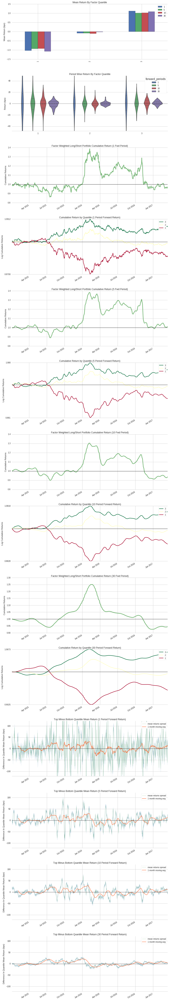

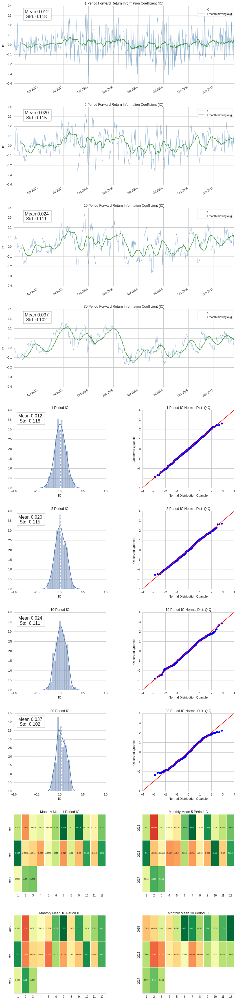

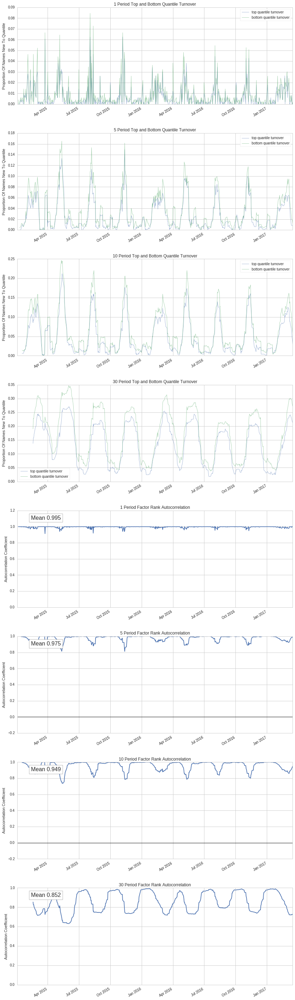

In [127]:
al.tears.create_full_tear_sheet(basic_income_factor)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-10.161484,0.014687,-0.040492,0.267676,274782,33.357370
2,0.009371,0.030423,0.018224,0.004660,274402,33.311239
3,0.023842,90.322895,0.122985,2.120205,274568,33.331391


Returns Analysis


,1,5,10,30
Ann. alpha,-0.103,-0.109,-0.118,-0.128
beta,-0.206,-0.242,-0.259,-0.122
Mean Period Wise Return Top Quantile (bps),0.745,3.517,6.639,16.599
Mean Period Wise Return Bottom Quantile (bps),-0.798,-3.901,-8.006,-27.531
Mean Period Wise Spread (bps),1.542,1.509,1.499,1.508


Information Analysis


,1,5,10,30
IC Mean,0.009,0.016,0.018,0.026
IC Std.,0.103,0.101,0.099,0.106
t-stat(IC),2.012,3.739,4.342,5.823
p-value(IC),0.045,0.000,0.000,0.000
IC Skew,-0.150,-0.137,-0.141,-0.130
IC Kurtosis,0.138,0.035,-0.099,-0.581
Ann. IR,1.354,2.517,2.923,3.920


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.008,0.036,0.068,0.177
Quantile 2 Mean Turnover,0.010,0.044,0.081,0.209
Quantile 3 Mean Turnover,0.007,0.028,0.054,0.143


,1,5,10,30
Mean Factor Rank Autocorrelation,0.995,0.974,0.949,0.852


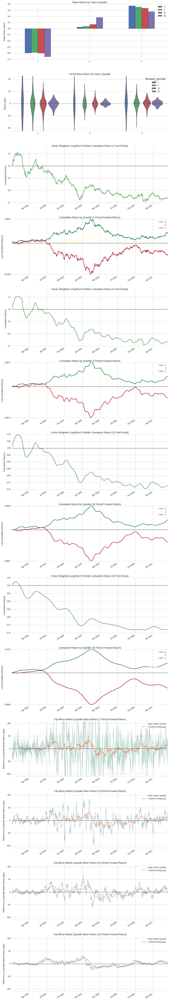

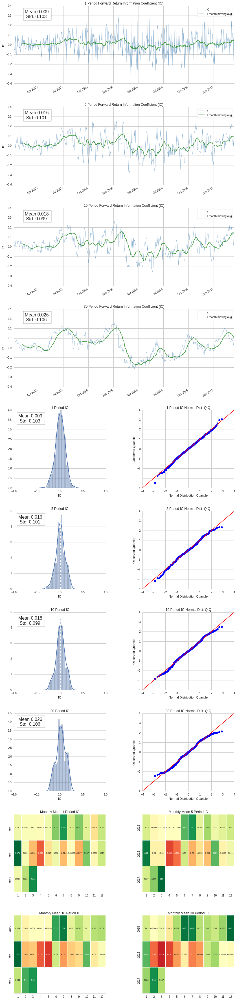

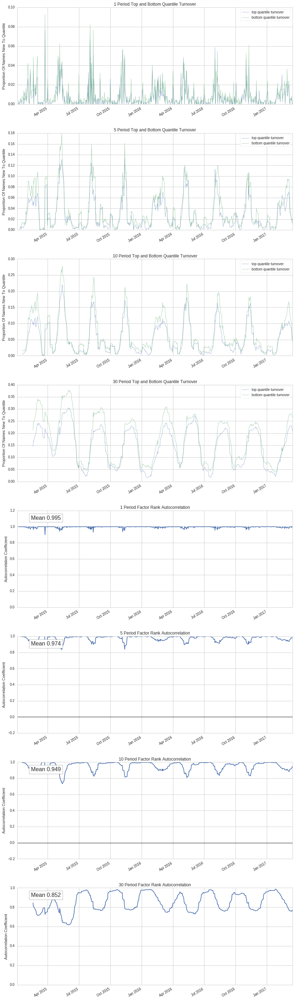

In [128]:
al.tears.create_full_tear_sheet(basic_roi_factor)

## EQUAL-WEIGHTED STATIC FACTOR TEAR SHEET

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-49.502488,0.112577,-0.619887,1.099748,274777,33.356763
2,-0.366077,0.709050,0.112476,0.168830,274404,33.311482
3,0.000004,122.366208,1.060706,2.840626,274571,33.331755


Returns Analysis


,1,5,10,30
Ann. alpha,-0.008,-0.005,-0.006,-0.020
beta,-0.073,-0.141,-0.169,-0.171
Mean Period Wise Return Top Quantile (bps),-0.109,-0.748,-2.958,-24.468
Mean Period Wise Return Bottom Quantile (bps),0.198,0.015,0.374,6.377
Mean Period Wise Spread (bps),-0.318,-0.172,-0.354,-1.036


Information Analysis


,1,5,10,30
IC Mean,0.006,0.007,0.003,-0.012
IC Std.,0.138,0.142,0.141,0.111
t-stat(IC),0.980,1.131,0.424,-2.534
p-value(IC),0.328,0.259,0.672,0.012
IC Skew,0.032,0.051,0.157,0.377
IC Kurtosis,0.041,-0.037,-0.132,0.240
Ann. IR,0.660,0.761,0.285,-1.706


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.163,0.242,0.305,0.429
Quantile 2 Mean Turnover,0.213,0.339,0.414,0.519
Quantile 3 Mean Turnover,0.156,0.230,0.289,0.412


,1,5,10,30
Mean Factor Rank Autocorrelation,0.827,0.763,0.69,0.502


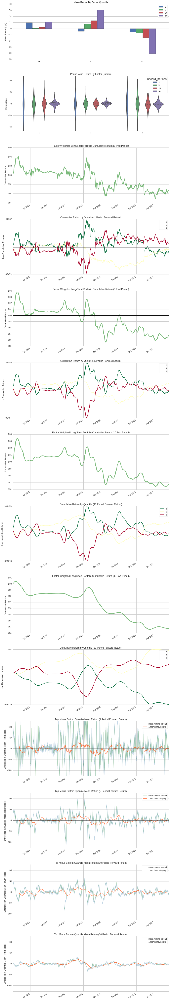

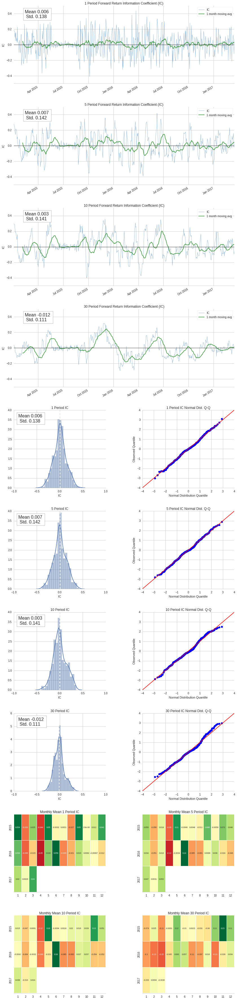

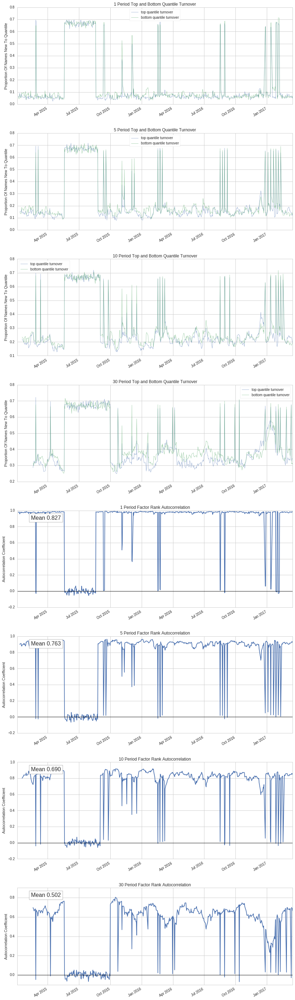

In [129]:
al.tears.create_full_tear_sheet(equal_weighted_factor)

## ADABOOST FACTOR TEAR SHEET

In [130]:
assets = results.index.levels[1]
pricing = get_pricing(assets, start, end + pd.Timedelta(days=30), fields="open_price")

In [131]:
factor_data_chosen = al.utils.get_clean_factor_and_forward_returns(results['ML'], pricing, quantiles=3, periods=(1, 5, 10, 30))

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.493097,0.501949,0.500964,0.000669,274810,33.360769
2,0.501603,0.503074,0.502388,0.000317,274403,33.311361
3,0.502717,0.515338,0.504122,0.001178,274539,33.327871


Returns Analysis


,1,5,10,30
Ann. alpha,0.024,0.024,0.024,0.034
beta,-0.234,-0.240,-0.244,-0.217
Mean Period Wise Return Top Quantile (bps),0.661,2.391,3.881,20.527
Mean Period Wise Return Bottom Quantile (bps),-0.729,-3.381,-5.940,-28.588
Mean Period Wise Spread (bps),1.389,1.186,1.026,1.671


Information Analysis


,1,5,10,30
IC Mean,0.006,0.010,0.012,0.026
IC Std.,0.140,0.135,0.138,0.128
t-stat(IC),1.058,1.791,2.017,4.831
p-value(IC),0.290,0.074,0.044,0.000
IC Skew,0.122,0.065,-0.045,0.067
IC Kurtosis,-0.081,-0.314,-0.394,-0.251
Ann. IR,0.712,1.206,1.358,3.252


Turnover Analysis


,1,5,10,30
Quantile 1 Mean Turnover,0.045,0.112,0.165,0.289
Quantile 2 Mean Turnover,0.079,0.189,0.266,0.425
Quantile 3 Mean Turnover,0.045,0.114,0.167,0.302


,1,5,10,30
Mean Factor Rank Autocorrelation,0.972,0.913,0.859,0.694


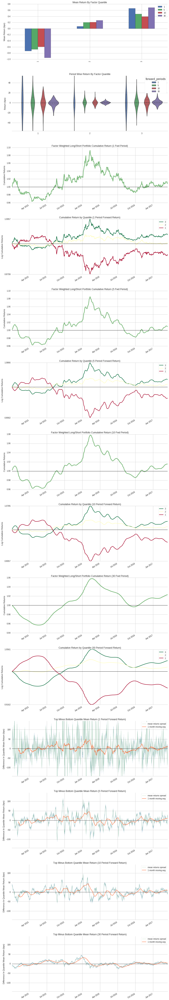

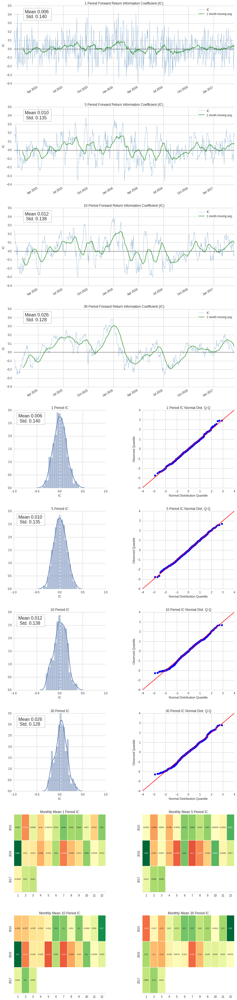

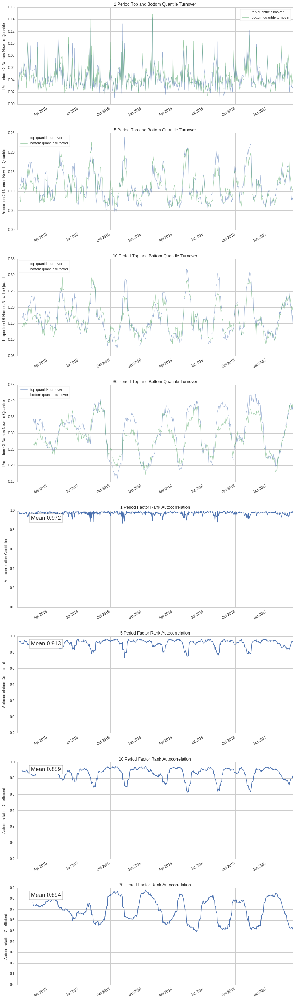

In [132]:
al.tears.create_full_tear_sheet(factor_data_chosen)

# EXAMINING ADABOOST FACTOR PREDICTION

In [62]:
n_fwd_days = 1

In [63]:
# Check weights
results_wo_returns = results.copy()
returns = results_wo_returns.pop('Returns')
results_wo_returns.pop('ML')
Y = returns.unstack().values
X = results_wo_returns.to_panel() 
X = X.swapaxes(2, 0).swapaxes(0, 1).values # (factors, time, stocks) -> (time, stocks, factors)

In [64]:
# Train-test split
train_size_perc = 0.8
n_time, n_stocks, n_factors = X.shape
train_size = np.int16(np.round(train_size_perc * n_time))
X_train, Y_train = X[:train_size, ...], Y[:train_size]
X_test, Y_test = X[(train_size+n_fwd_days):, ...], Y[(train_size+n_fwd_days):]

In [65]:
X_train_shift, Y_train_shift = shift_mask_data(X_train, Y_train, n_fwd_days=n_fwd_days)
X_test_shift, Y_test_shift = shift_mask_data(X_test, Y_test, n_fwd_days=n_fwd_days, 
                                             lower_percentile=50, 
                                             upper_percentile=50)

In [66]:
X_train_shift.shape, X_test_shift.shape

((405962, 6), (165732, 6))

In [67]:
start = time()

# Train classifier
imputer = preprocessing.Imputer()
scaler = preprocessing.MinMaxScaler()
clf = ensemble.AdaBoostClassifier(n_estimators=150) # n_estimators controls how many weak classifiers are fi

X_train_trans = imputer.fit_transform(X_train_shift)
X_train_trans = scaler.fit_transform(X_train_trans)
clf.fit(X_train_trans, Y_train_shift)

end = time()

In [68]:
print "Time to train full ML pipline: %0.2f secs" % (end - start)

Time to train full ML pipline: 68.05 secs


In [69]:
Y_pred = clf.predict(X_train_trans)
print('Accuracy on train set = {:.2f}%'.format(metrics.accuracy_score(Y_train_shift, Y_pred) * 100))

Accuracy on train set = 54.88%


In [70]:
# Transform test data
X_test_trans = imputer.transform(X_test_shift)
X_test_trans = scaler.transform(X_test_trans)

In [71]:
# Predict!
Y_pred = clf.predict(X_test_trans)

Y_pred_prob = clf.predict_proba(X_test_trans)

In [72]:
print 'Predictions:', Y_pred
print 'Probabilities of class == 1:', Y_pred_prob[:, 1] * 100

Predictions: [-1.  1. -1. ..., -1.  1.  1.]
Probabilities of class == 1: [ 49.98666759  50.03705808  49.96905215 ...,  49.99223103  50.01336145
  50.00725803]


In [73]:
print('Accuracy on test set = {:.2f}%'.format(metrics.accuracy_score(Y_test_shift, Y_pred) * 100))

Accuracy on test set = 54.05%


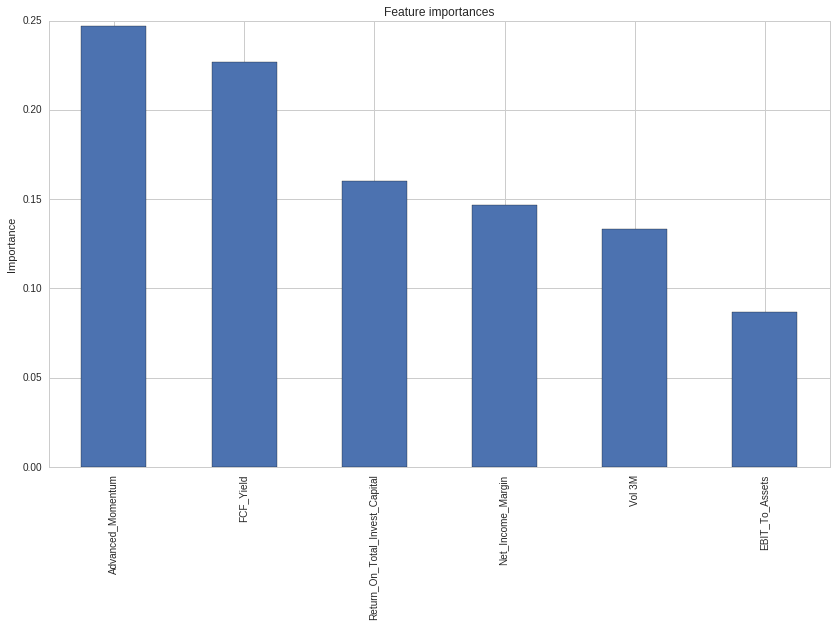

In [74]:
feature_importances = pd.Series(clf.feature_importances_, index=results_wo_returns.columns)
feature_importances.sort(ascending=False)
ax = feature_importances.plot(kind='bar')
ax.set(ylabel='Importance', title='Feature importances');

# BACKTEST ANALYSIS WITH PYFOLIO

In [133]:
boosted_backtest = get_backtest('590a03d7a7ed3761dfda8647')

100% Time: 0:00:03|###########################################################|


Entire data start date: 2015-01-02
Entire data end date: 2017-05-01


Backtest Months: 27


Performance statistics,Backtest
annual_return,-0.07
cum_returns_final,-0.16
annual_volatility,0.16
sharpe_ratio,-0.41
calmar_ratio,-0.22
stability_of_timeseries,0.78
max_drawdown,-0.34
omega_ratio,0.93
sortino_ratio,-0.52
skew,-0.85


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,33.67,2015-01-22,2016-11-17,NaT,NaN
1,1.35,2015-01-14,2015-01-16,2015-01-22,7
2,0.74,2015-01-07,2015-01-09,2015-01-13,5
3,0.00,2015-01-06,2015-01-06,2015-01-06,1
4,0.00,2015-01-06,2015-01-06,2015-01-06,1




[-0.02  -0.041]


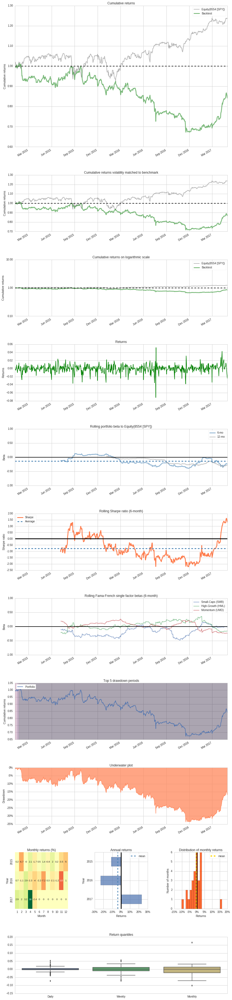

/usr/local/lib/python2.7/dist-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
Fall2015,-0.07%,-3.66%,1.66%
New Normal,-0.03%,-7.19%,5.19%


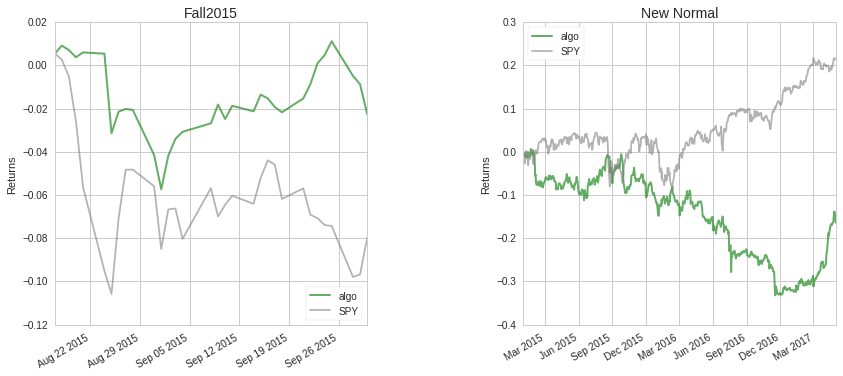

Top 10 long positions of all time,max
STRP-45130,6.33%
GLBS-40488,5.19%
GKNT-20996,4.41%
COOL-26972,4.14%
DXM-39191,3.97%
NYMX-17902,3.78%
PLUG-20776,3.66%
RNN-30739,3.40%
DCTH-23115,3.24%
MHGC-28094,3.05%


Top 10 short positions of all time,max
OPTT-33734,-13.47%
WINS-49534,-10.53%
PRGN-34526,-5.50%
ENRJ-33583,-5.37%
PRZM-23305,-4.96%
ADAT-22486,-4.96%
SGY-9458,-4.81%
VPCO-30148,-4.42%
VBLT-47419,-4.35%
ESPR-44989,-4.18%


Top 10 positions of all time,max
OPTT-33734,13.47%
WINS-49534,10.53%
STRP-45130,6.33%
PRGN-34526,5.50%
ENRJ-33583,5.37%
GLBS-40488,5.19%
PRZM-23305,4.96%
ADAT-22486,4.96%
SGY-9458,4.81%
VPCO-30148,4.42%


All positions ever held,max
OPTT-33734,13.47%
WINS-49534,10.53%
STRP-45130,6.33%
PRGN-34526,5.50%
ENRJ-33583,5.37%
GLBS-40488,5.19%
PRZM-23305,4.96%
ADAT-22486,4.96%
SGY-9458,4.81%
VPCO-30148,4.42%


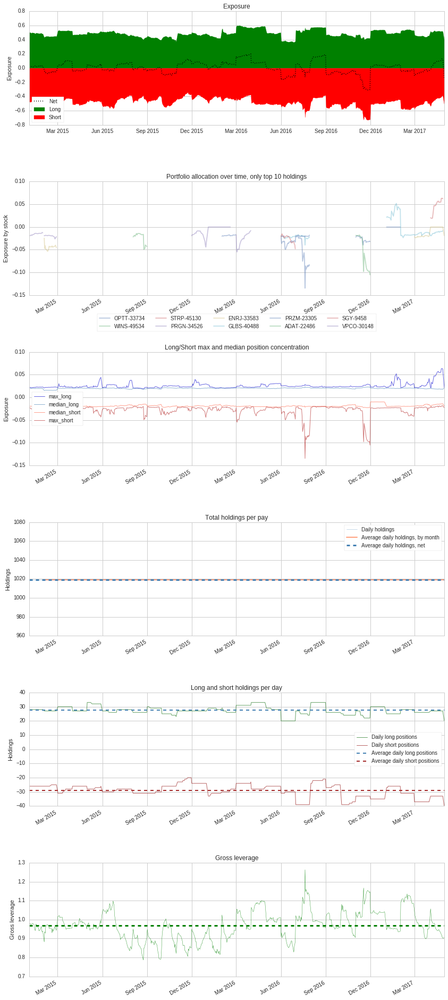

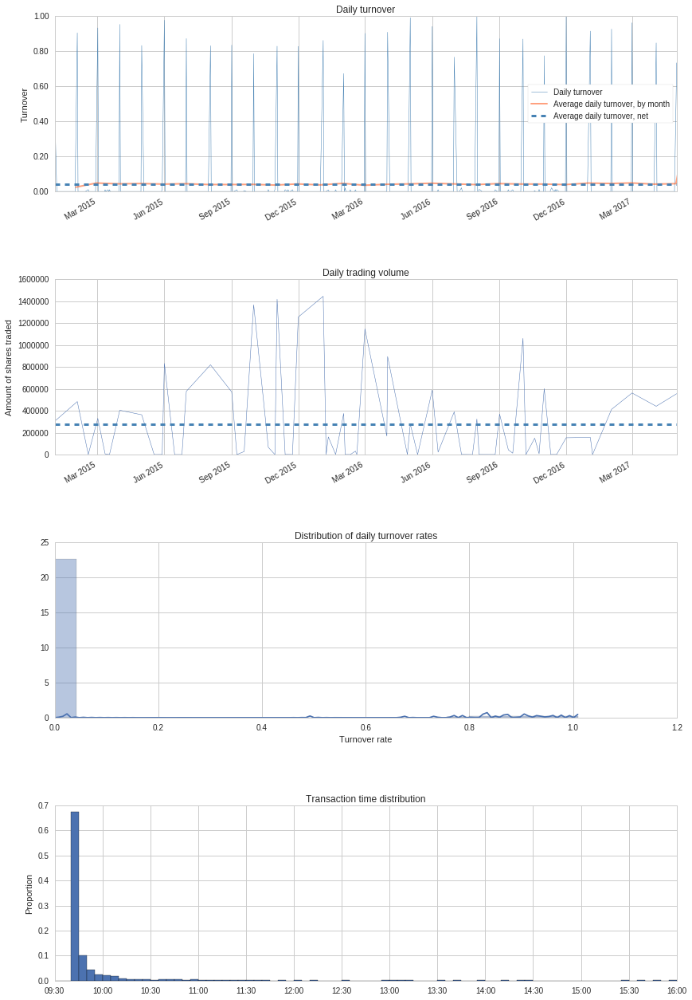

In [134]:
boosted_backtest.create_full_tear_sheet()